In [ ]:
%%capture
!pip install satpy h5netcdf pyorbital pyspectral

In [ ]:
!wget -q https://raw.githubusercontent.com/jhbravo/read_aws-cloud_abi_data/main/config_loader.py -O /usr/local/lib/python3.6/dist-packages/satpy/composites/config_loader.py

In [ ]:
!wget -q https://raw.githubusercontent.com/jhbravo/read_aws-cloud_abi_data/main/abi_base.py -O /usr/local/lib/python3.6/dist-packages/satpy/readers/abi_base.py

In [ ]:
from satpy import Scene

In [ ]:
urls = ['https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2020/259/16/OR_ABI-L1b-RadC-M6C01_G16_s20202591601139_e20202591603512_c20202591603573.nc',
        'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2020/259/16/OR_ABI-L1b-RadC-M6C02_G16_s20202591601139_e20202591603512_c20202591603552.nc',
        'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2020/259/16/OR_ABI-L1b-RadC-M6C03_G16_s20202591601139_e20202591603512_c20202591603561.nc',
        'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2020/259/16/OR_ABI-L1b-RadC-M6C04_G16_s20202591601139_e20202591603512_c20202591603543.nc',
        'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2020/259/16/OR_ABI-L1b-RadC-M6C05_G16_s20202591601139_e20202591603512_c20202591603580.nc',
        'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2020/259/16/OR_ABI-L1b-RadC-M6C06_G16_s20202591601139_e20202591603518_c20202591603567.nc',
        'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2020/259/16/OR_ABI-L1b-RadC-M6C07_G16_s20202591601139_e20202591603523_c20202591604003.nc',
        'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2020/259/16/OR_ABI-L1b-RadC-M6C08_G16_s20202591601139_e20202591603512_c20202591604009.nc',
        'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2020/259/16/OR_ABI-L1b-RadC-M6C09_G16_s20202591601139_e20202591603518_c20202591604034.nc',
        'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2020/259/16/OR_ABI-L1b-RadC-M6C10_G16_s20202591601139_e20202591603523_c20202591603596.nc',
        'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2020/259/16/OR_ABI-L1b-RadC-M6C11_G16_s20202591601139_e20202591603512_c20202591603589.nc',
        'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2020/259/16/OR_ABI-L1b-RadC-M6C12_G16_s20202591601139_e20202591603518_c20202591604016.nc',
        'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2020/259/16/OR_ABI-L1b-RadC-M6C13_G16_s20202591601139_e20202591603523_c20202591604046.nc',
        'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2020/259/16/OR_ABI-L1b-RadC-M6C14_G16_s20202591601139_e20202591603512_c20202591604027.nc',
        'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2020/259/16/OR_ABI-L1b-RadC-M6C15_G16_s20202591601139_e20202591603518_c20202591604053.nc',
        'https://noaa-goes16.s3.amazonaws.com/ABI-L1b-RadC/2020/259/16/OR_ABI-L1b-RadC-M6C16_G16_s20202591601139_e20202591603523_c20202591604041.nc']

In [ ]:
scn = Scene(reader='abi_l1b', filenames=urls)

In [ ]:
scn.load([f'C{n:02d}' for n in range(1,17)])

In [ ]:
from pyresample.geometry import AreaDefinition
a2km = scn['C13'].area
a4km = AreaDefinition(a2km.area_id, '4km at nadir',  a2km.proj_id, a2km.proj_dict, a2km.x_size / 2, a2km.y_size / 2, a2km.area_extent)

In [ ]:
#nscn = scn.resample(a2km, resampler='native')
nscn = scn.resample(a4km)

/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in cos
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in sin
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in cos
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in sin
  return func(*(_execute_task(a, cache) for a in args))


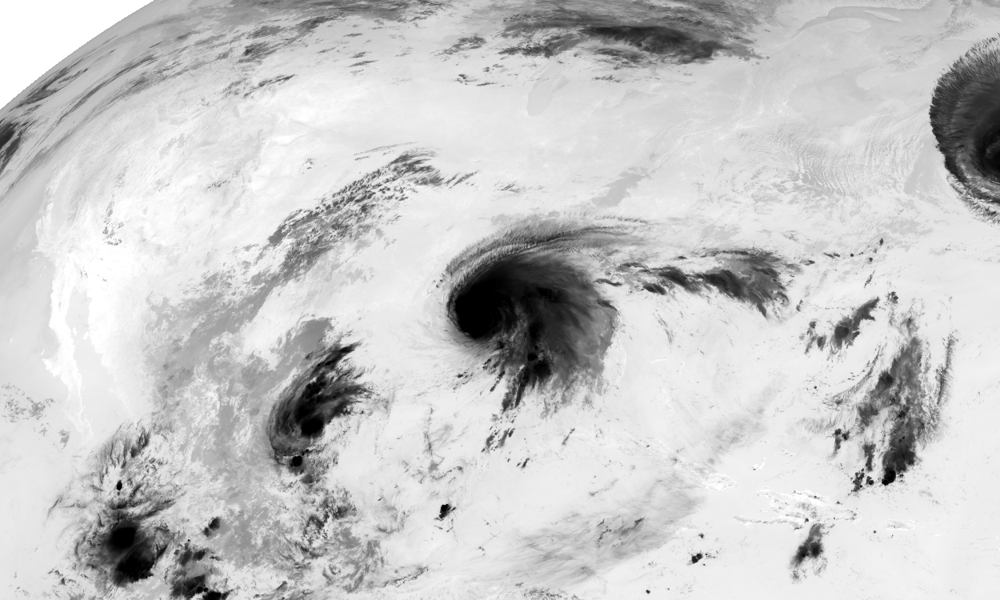

In [ ]:
nscn.show('C13')

In [ ]:
scn.all_composite_names()

/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in cos
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in sin
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in cos
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in sin
  return func(*(_execute_task(a, cache) for a in args))


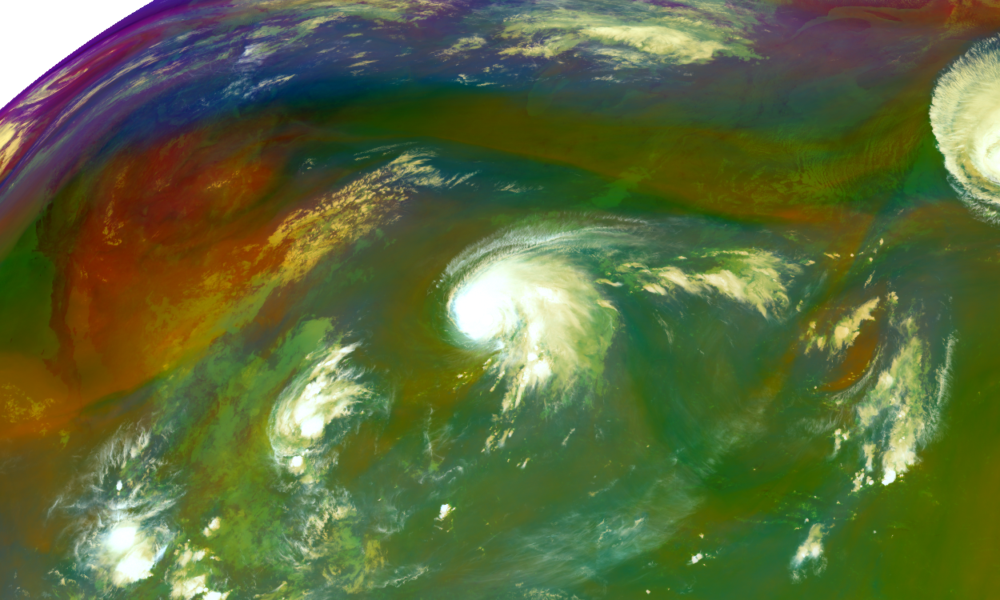

In [ ]:
rgbim = 'airmass'
nscn.load([rgbim,])
nscn.show(rgbim)

/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in cos
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in sin
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in cos
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in sin
  return func(*(_execute_task(a, cache) for a in args))


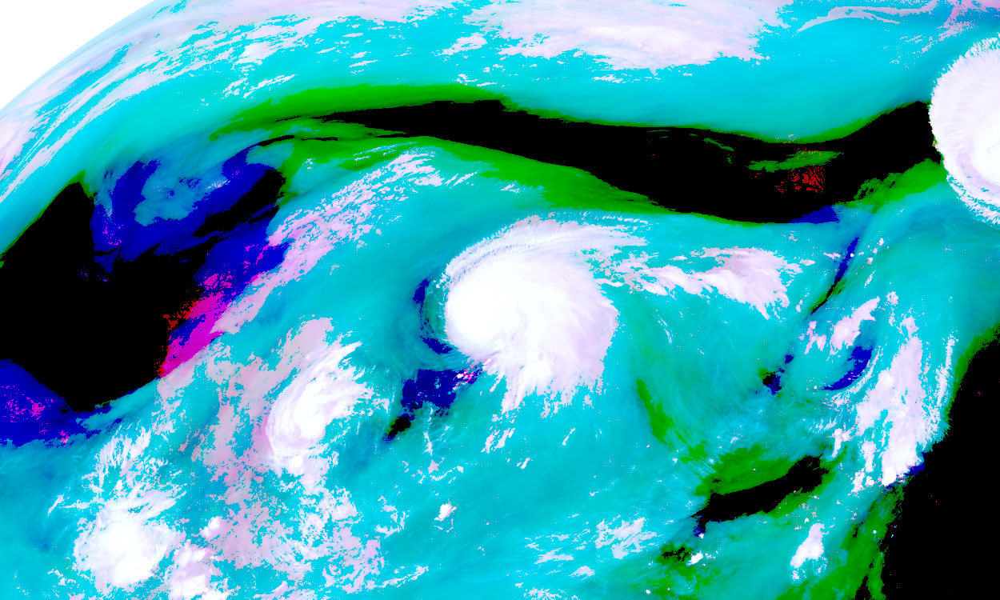

In [ ]:
rgbim = 'water_vapors1'
nscn.load([rgbim,])
nscn.show(rgbim)

100%|██████████| 52/52 [00:00<00:00, 886.36kB/s]
No rsr file /root/.local/share/pyspectral/rsr_abi_GOES-16.h5 on disk
4494378it [00:02, 1776914.26it/s]
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in cos
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in sin
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in remainder
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in cos
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-pa

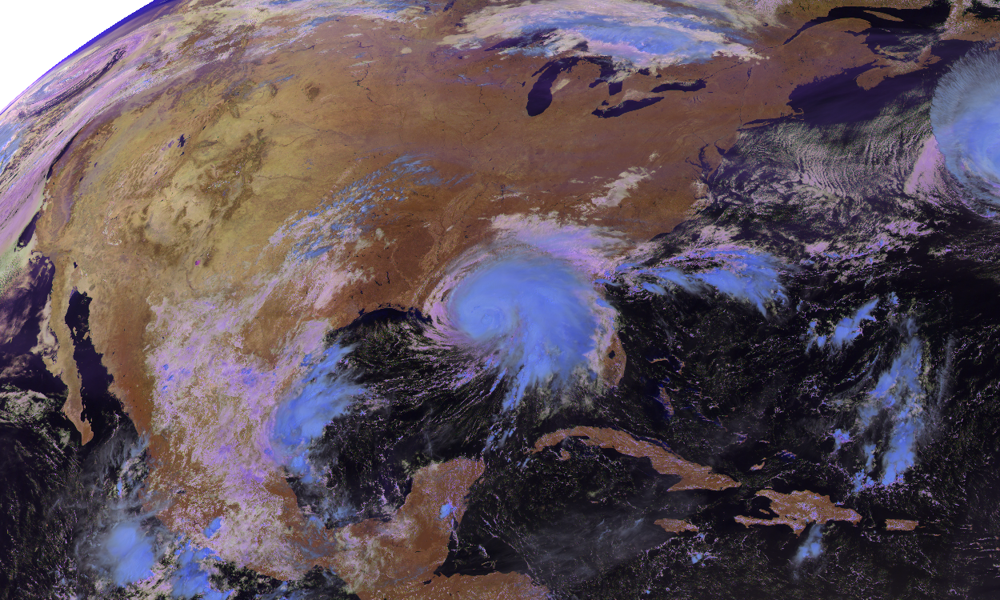

In [ ]:
rgbim = 'cloud_phase'
nscn.load([rgbim,])
nscn.show(rgbim)

/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in cos
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in sin
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in remainder
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in cos
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in sin
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3

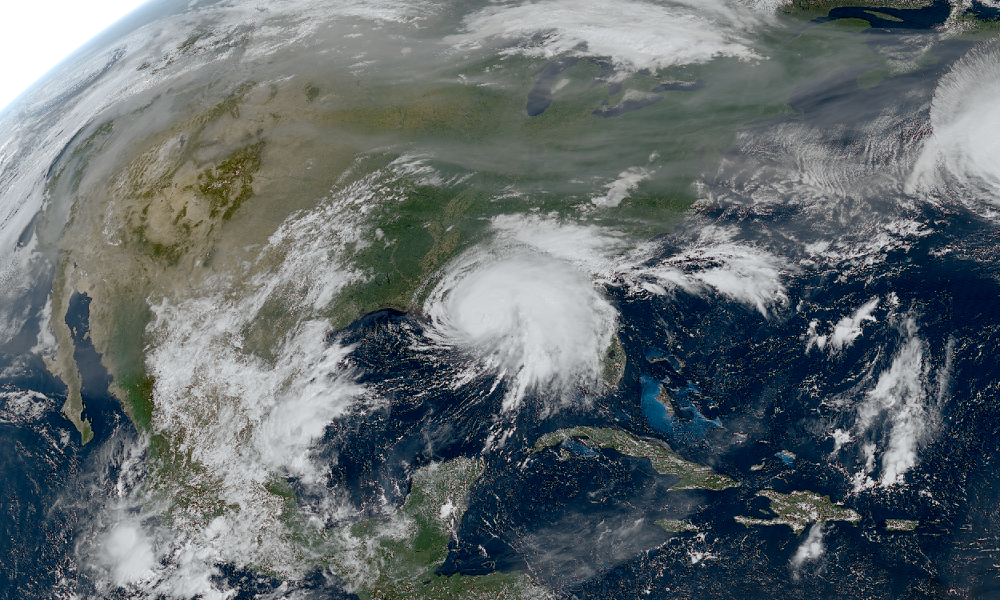

In [ ]:
rgbim = 'true_color'
nscn.load([rgbim,])
nscn.show(rgbim)

In [ ]:
%%capture
## install cartopy source: https://github.com/googlecolab/colabtools/issues/85#issuecomment-709241391
# not using `python-cartopy` package as it doesn't include all build dependencies
!apt-get install libproj-dev proj-bin proj-data
!apt-get install libgeos-dev

# shapely needs to be reinstalled to use the same geos install as cartopy (https://github.com/SciTools/cartopy/issues/871)
!pip uninstall -y shapely
!pip install --no-binary shapely shapely
!pip install cartopy

In [ ]:
from satpy.writers import get_enhanced_image

import numpy as np
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
%matplotlib inline

In [ ]:
fig = plt.figure(figsize=(10, 10), dpi=200)

cmap = ['#ffffff',] * 19 +   ['#7f007f', '#8c0d87', '#99198e', '#a52696', '#b2339d', '#bf40a5', '#cc4cad', '#d959b4', '#e566bc', '#f272c3', '#ff7fcb', '#e6e6e6', '#cdcdcd',
        '#b3b3b3', '#9a9a9a', '#808080', '#676767', '#4d4d4d', '#343434', '#1a1a1a', '#000000', '#1a0000', '#330000', '#4d0000', '#660000', '#800000', '#990000', '#b30000', '#cc0000',
        '#e60000', '#ff0000', '#ff1a00', '#ff3300', '#ff4d00', '#ff6600', '#ff8000', '#ff9900', '#ffb300', '#ffcc00', '#ffe600', '#ffff00', '#e6ff00', '#ccff00', '#b3ff00', '#99ff00',
        '#80ff00', '#66ff00', '#4dff00', '#33ff00', '#1aff00', '#00ff00', '#00ea0a', '#00d513', '#00bf1d', '#00aa26', '#009530', '#00803a', '#006a43', '#00554d', '#004056', '#002b60',
        '#001569', '#000073', '#000073', '#000d7a', '#001a81', '#002688', '#00338f', '#004096', '#004d9d', '#0059a4', '#0066ab', '#0073b2', '#0080b9', '#008cc0', '#0099c7', '#00a6ce',
        '#00b3d5', '#00bfdc', '#00cce3', '#00d9ea', '#00e6f1', '#00f2f8', '#00ffff', '#ffffff', '#ffffff', '#ffffff', '#ffffff', '#ffffff', '#ffffff', '#ffffff', '#fefefe', '#fcfcfc',
        '#f9f9f9', '#f7f7f7', '#f4f4f4', '#f2f2f2', '#efefef', '#ededed', '#eaeaea', '#e8e8e8', '#e5e5e5', '#e2e2e2', '#e0e0e0', '#dddddd', '#dbdbdb', '#d8d8d8', '#d6d6d6', '#d3d3d3',
        '#d1d1d1', '#cecece', '#cbcbcb', '#c9c9c9', '#c6c6c6', '#c4c4c4', '#c1c1c1', '#bfbfbf', '#bcbcbc', '#bababa', '#b7b7b7', '#b5b5b5', '#b2b2b2', '#afafaf', '#adadad', '#aaaaaa',
        '#a8a8a8', '#a5a5a5', '#a3a3a3', '#a0a0a0', '#9e9e9e', '#9b9b9b', '#989898', '#969696', '#939393', '#919191', '#8e8e8e', '#8c8c8c', '#898989', '#878787', '#848484', '#828282',
        '#7f7f7f', '#7c7c7c', '#7a7a7a', '#777777', '#757575', '#727272', '#707070', '#6d6d6d', '#6b6b6b', '#686868', '#656565', '#636363', '#606060', '#5e5e5e', '#5b5b5b', '#595959',
        '#565656', '#545454', '#515151', '#4f4f4f', '#4c4c4c', '#494949', '#474747', '#444444', '#424242', '#3f3f3f', '#3d3d3d', '#3a3a3a', '#383838', '#353535', '#323232', '#303030',
        '#2d2d2d', '#2b2b2b', '#282828', '#262626', '#232323', '#212121', '#1e1e1e', '#1c1c1c', '#191919', '#161616', '#141414', '#111111', '#0f0f0f', '#0c0c0c', '#0a0a0a', '#070707',
        '#050505', '#020202', ] + ['#000000',] * 46

levels = np.linspace(-109+237.15, 56+237.15, num=len(cmap))
norm = plt.cm.colors.BoundaryNorm(levels, len(levels))
irmap = plt.cm.colors.ListedColormap(cmap)

var = nscn['C13']
strs = var.attrs
abi_crs = var.area.to_cartopy_crs()
ax = fig.add_subplot(1, 1, 1, projection=abi_crs)
ir_img = ax.imshow(var, origin='upper', extent=(var.x[0], var.x[-1], var.y[-1], var.y[0]), cmap=irmap)

#ax.set_extent([-123.0, -74.5, 10.0, 37.0]) #cambiar a area geografica de interes

ax.coastlines(resolution='50m', color='cyan', linewidth=0.3)

plt.title(f"{strs['orbital_slot']} | {strs['name']}\n{strs['start_time']:%Y-%m-%d %H:%M} UTC", fontweight='bold', fontsize=10, loc='left')
plt.title(f"{strs['scene_id']}", fontweight='bold', fontsize=10, loc='right')


In [ ]:
var = get_enhanced_image(nscn['true_color']).data
var = var.transpose('y', 'x', 'bands')

/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in remainder
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in sin
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.6/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in cos
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3

Text(1.0, 1.0, 'CONUS')

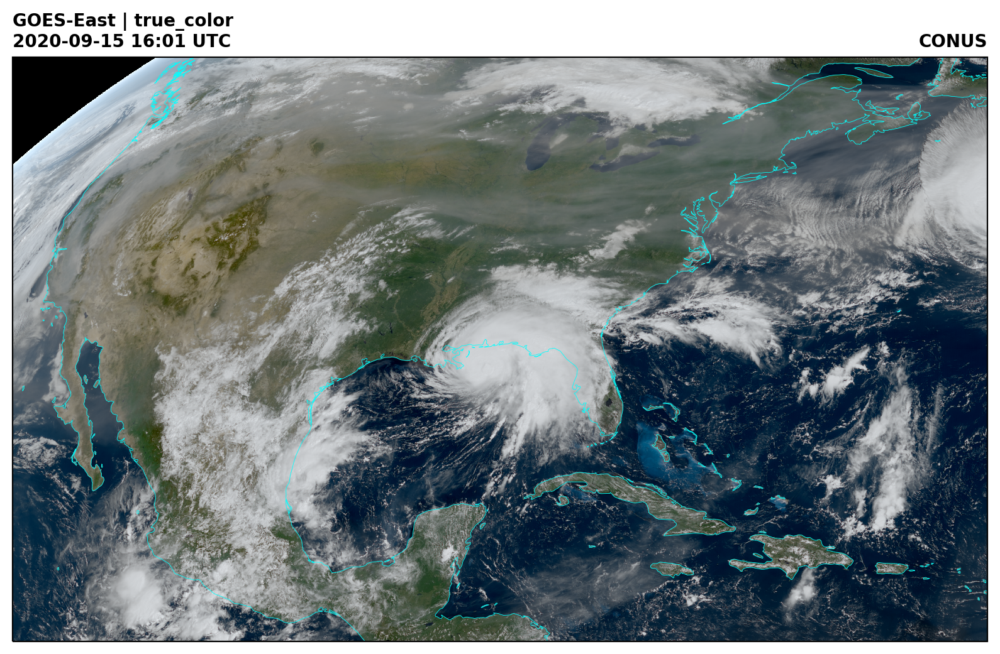

In [ ]:
fig = plt.figure(figsize=(10, 10), dpi=200)
strs = var.attrs
abi_crs = var.attrs['area'].to_cartopy_crs()
ax = fig.add_subplot(1, 1, 1, projection=abi_crs)
ax.imshow(var.data, extent=(var.x[0], var.x[-1], var.y[-1], var.y[0]), origin='upper')

#ax.set_extent([-123.0, -74.5, 10.0, 37.0]) #cambiar a area geografica de interes

ax.coastlines(resolution='50m', color='cyan', linewidth=0.3)

plt.title(f"{strs['orbital_slot']} | {strs['name']}\n{strs['start_time']:%Y-%m-%d %H:%M} UTC", fontweight='bold', fontsize=10, loc='left')
plt.title(f"{strs['scene_id']}", fontweight='bold', fontsize=10, loc='right')